_Udacity Self-Driving Car Nanodegree_
Project 4- **Advanced Lane Finding**
----
_Lorenzo's version_

This goal of this project is to build a pipeline which, given an image or sequence of images, is able to identify accurately the lanes on the road, so that the self-driving car can take some decisions based on this input.
Here are the steps in order to achieve this:
* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

### Step 0: Helper functions

A first helper function for comparing the input and the output of a pipeline:

In [1215]:
import matplotlib.pyplot as plt
import random
%matplotlib inline

# Helper function that help compare a random list of images with a custom transformation
def compare_images(num_images, list_images, output_func, input_func = lambda x: x, cmap_out=None, cmap_in=None, save_to=''):  
    f, subs = plt.subplots(num_images, 2, figsize=(24, 9*num_images))
    f.tight_layout()
    samples = random.sample(list_images, num_images)
    
    for idx, sample_image in enumerate(samples):        
        subs[idx,0].imshow(pipe(sample_image, plt.imread, input_func),cmap=cmap_in)
        subs[idx,0].set_title('Original Image', fontsize=30)
        subs[idx,1].imshow(pipe(sample_image, plt.imread, output_func),cmap=cmap_out)
        subs[idx,1].set_title('Transformed Image', fontsize=30)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    if save_to is not '':
        f.savefig(save_to)

This second function below helps describing a pipeline step by step (left to right). This is to correct for the fact that the original `compose` function from _toolz_ executes the functions from right to left.

In [ ]:
# A bit of functional programming...
from toolz import compose
from functools import reduce
# Helper function in order to construct the pipeline from left to right
compose_functions = lambda funcs: compose(*funcs[::-1]) 

### Step 1: Calibrating the camera
Here we are going to use some 9x6 chessboard pictures in calibrate our camera.

In [7]:
import numpy as np
import cv2
import glob

In [153]:
# Prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
# -> These are the corners of the 9*6 chessboard after putting it them on a 2d plan.
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# List of all calibration images
calib_images = glob.glob('camera_cal/calibration*.jpg')

Let's show some corners:

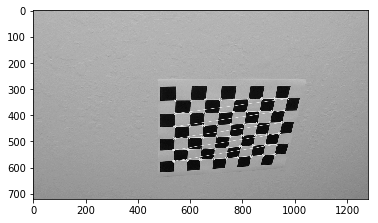

In [107]:
img = random.choice(calib_images)

def drawChessboardCorners(img):
    ret, corners = cv2.findChessboardCorners(img, (9,6), None)
    return cv2.drawChessboardCorners(img, (9,6), corners, ret)

read_gray_img = compose_functions([
    cv2.imread,                                        # Read image
    lambda img: cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)  # Convert to grayscale
])

show_corners_pipeline = compose_functions([
    read_gray_img,
    drawChessboardCorners,                             # Draw corners
    lambda img: plt.imshow(img, cmap='gray')           # ..and finally display
])

show_corners_pipeline(img);

In [89]:
# Maps a GRAY image to the calibration points: object points and image points
def get_calibration_points(gray_img):
    ret, corners = cv2.findChessboardCorners(gray_img, (9,6), None)
    return (objp, corners) if ret == True else ([], [])

In [93]:
calib_pipeline = compose_functions([
    read_gray_img,
    get_calibration_points                             # Get the calibration points
])
calibs = list(map(calib_pipeline, calib_images))

In [123]:
# Getting object points and image points separately
objpoints = [x[0] for x in calibs if len(x[0]) > 0]
imgpoints = [x[1] for x in calibs if len(x[1]) > 0]

Now that we have got the object points and corresponding images points, we can get the calibrate coefficients for our camera and define our undistort function:

In [128]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, read_gray_img(img).shape[::-1], None, None)
undistort = lambda img: cv2.undistort(img, mtx, dist, None, mtx)

Let's look at a few undistorted images:

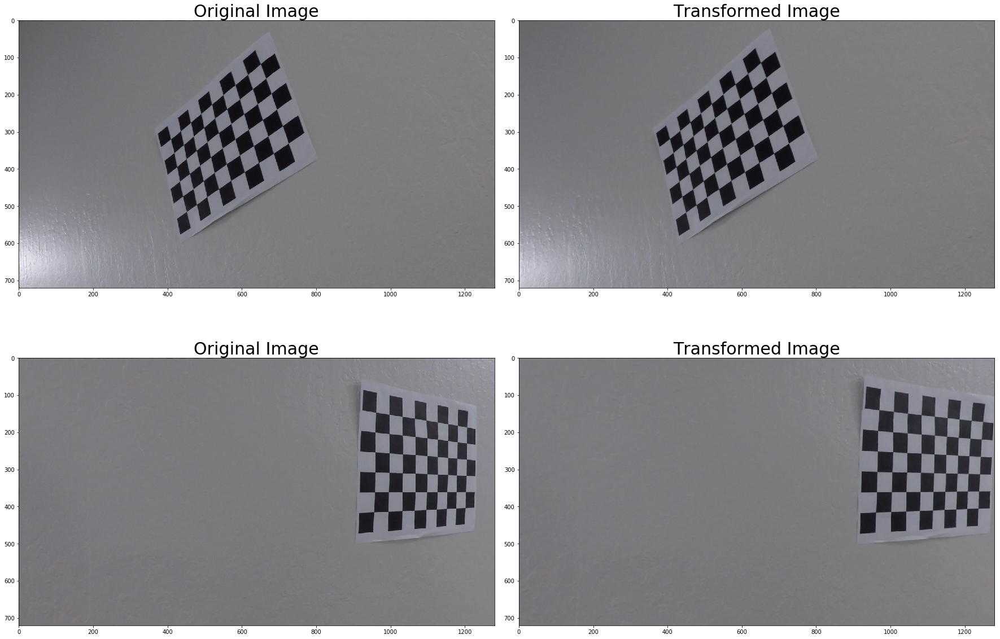

In [1216]:
compare_images(2, calib_images, undistort, save_to='calibration.png')

### Step 2: A clean bird's eye view on the situation
Next, we need to convert our images to a bird's eye view, by passing our undistorted images through:
* perspective transform
* color thresholding
* gradient thresholding


Let's have a look at some sample images first:

There are 8 sample images


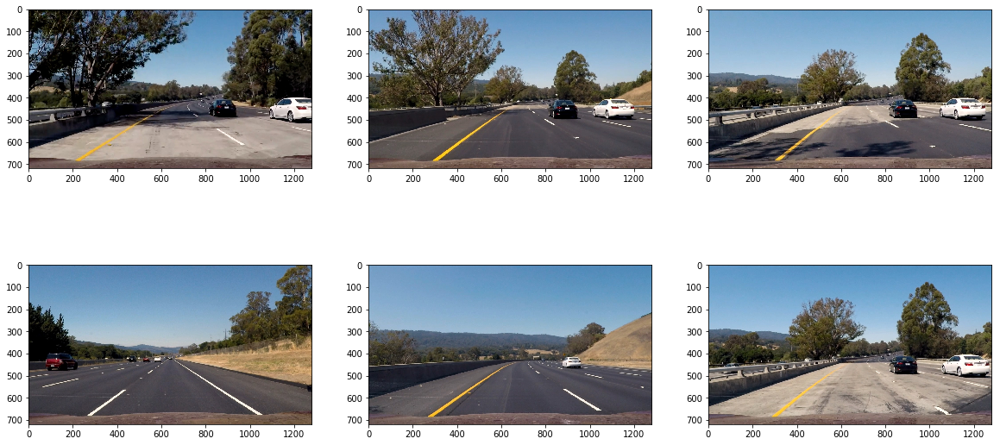

In [917]:
# List of sample images
sample_images = glob.glob('test_images/*.jpg')
print('There are {} sample images'.format(len(sample_images)))

num_sample_images = 6
fig = plt.figure(figsize=(20,10))

samples = random.sample(sample_images, num_sample_images)

for idx, sample_image in enumerate(samples):
    fig.add_subplot(num_sample_images/3, 3, idx+1)
    plt.imshow(plt.imread(sample_image))

Let's see how the calibration step works on some images:

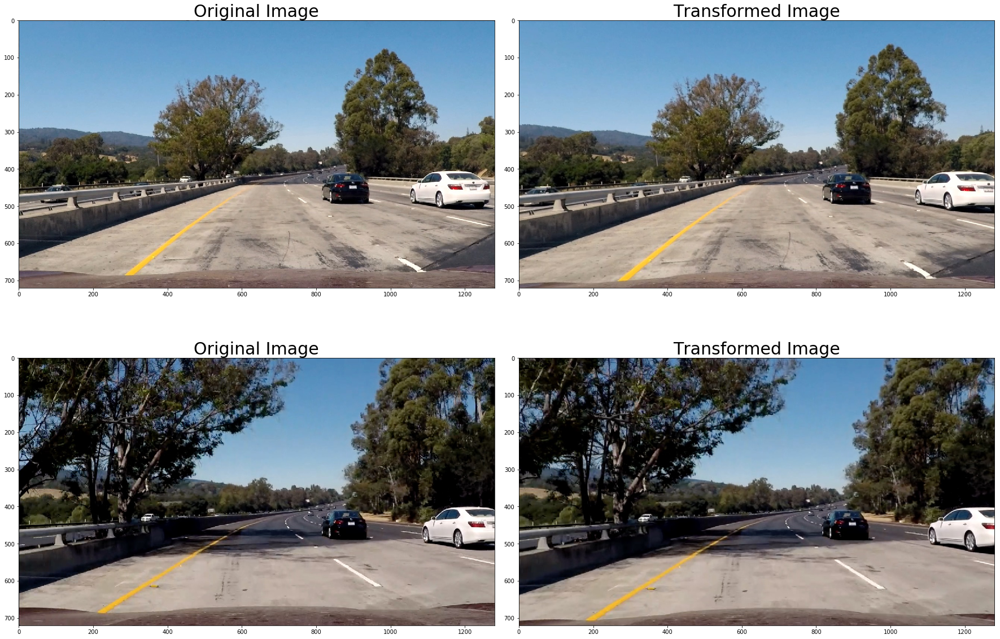

In [1224]:
compare_images(
    2, 
    sample_images, 
    undistort,
    save_to='undistorted.png'
)

#### 1. Perspective transform

In this step, we select a part of the image that we know would fit on a 2d space (i.e. the road), and then convert it to this space.

In [790]:
# In this case, M is a constant, because we will always focus on the same region of interest.
height = 720
width = 1280
lower_width_offset = 420 #220
higher_width_offset = 50 #580
lower_height = 680
higher_height = 450
src_vertices = [
    (width/2-lower_width_offset,           lower_height),
    (width/2-higher_width_offset,          higher_height),
    (width/2+higher_width_offset,           higher_height),
    (width/2+lower_width_offset,           lower_height)
]
src = np.float32(src_vertices)
dst = np.float32([(500,700),(500,80),(900,80),(900,700)])

M = cv2.getPerspectiveTransform(src, dst)
Minv = cv2.getPerspectiveTransform(dst, src)

perspective_pipeline = compose_functions([
    undistort,   # We undistort the image first
    lambda img: cv2.warpPerspective(img, M, (img.shape[1], img.shape[0]))
])

In [1230]:
src_vertices

[(220.0, 680), (590.0, 450), (690.0, 450), (1060.0, 680)]

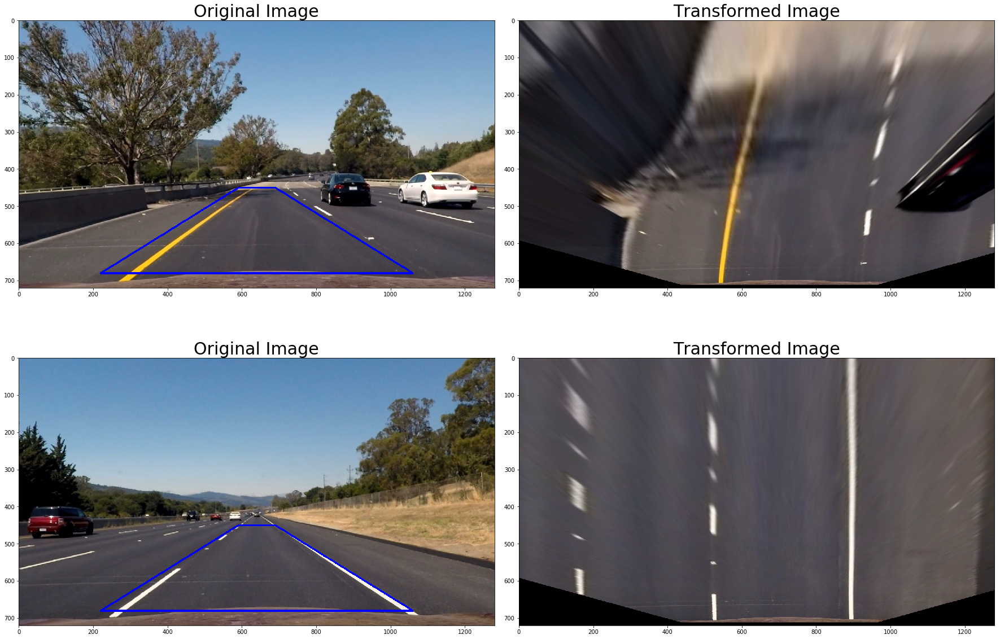

In [1229]:
compare_images(
    2, 
    sample_images, 
    perspective_pipeline, 
    input_func=lambda img: cv2.polylines(undistort(img),[src.astype(np.int32)],True,(0,0,255),3),
    save_to='perspective_transform.png'
)

#### 2. Color thresholding

Here we apply a filter on both H and S channels, in the HSV color space.

In [ ]:
# Helper vectorize function for binary thresholds
low_high_binary = lambda val, low, high: 1.0 if val >= low and val <= high else 0.0
low_high_bin_vect = np.vectorize(low_high_binary)

In [878]:
v_low, v_high, s_low, s_high = 50, 255, 100, 255

to_hls = lambda i: cv2.cvtColor(i, cv2.COLOR_RGB2HLS)#.astype(np.float32)
to_hsv = lambda i: cv2.cvtColor(i, cv2.COLOR_RGB2HSV)#.astype(np.float32)

color_thresholding_pipeline = compose_functions([
    lambda img: (to_hls(img), to_hsv(img)), # Converting to HLS
    lambda hls_hsv: (hls_hsv[0][:,:,2],hls_hsv[1][:,:,2]),                               # Taking H and S channels
    lambda hs: np.logical_and(                                         # Keeping only the combination
        low_high_bin_vect(hs[0], s_low, s_high),                       #   of H values and S values
        low_high_bin_vect(hs[1], v_low, v_high)                        #   within the thresolds (logical and)
    ),
    lambda img: img.astype(np.float32)
])

Let's have a look at how our color thresholding pipeline outputs:

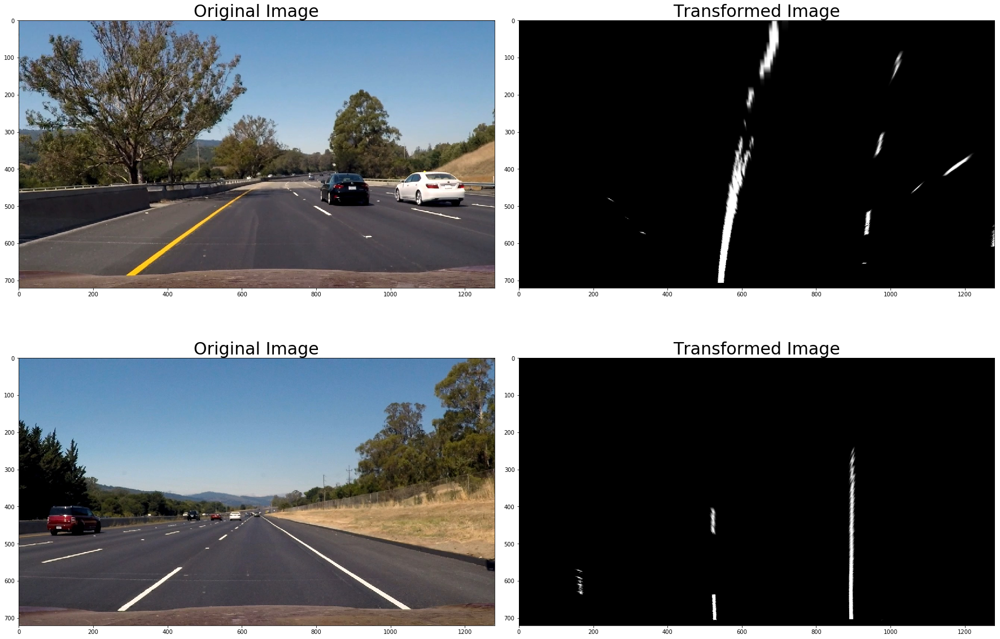

In [1240]:
compare_images(
    2, 
    sample_images, 
    compose_functions([color_thresholding_pipeline, perspective_pipeline]), 
    cmap_out='gray'
)

#### 3. Gradient thresholding

We then construct our gradient thresholding pipeline. _Notice that for now, both color and gradient filters are separated. We will put them together later_.

In [876]:
sobelx = lambda i: cv2.Sobel(i, cv2.CV_64F, 1, 0) #, ksize=sobel_kernel)
sobely = lambda i: cv2.Sobel(i, cv2.CV_64F, 0, 1)

gradient_thresholding_pipeline = compose_functions([
    lambda img: cv2.cvtColor(img, cv2.COLOR_RGB2GRAY),#[:,:,2],                   # Color channel function
    lambda channel: (sobelx(channel), sobely(channel)),
    lambda deriv: tuple(np.absolute(x) for x in deriv),                     # Absolute value of the derivative
    lambda absol: tuple(np.uint8(255*x/np.max(x)) for x in absol),
    lambda ds: np.logical_and(
        #low_high_bin_vect(ds[0], -np.pi/6, np.pi/6),
        low_high_bin_vect(ds[0], 12, 255),
        low_high_bin_vect(ds[1], 25, 255)     # Binary threshold filter
    ),
    lambda img: img.astype(np.float32)
])

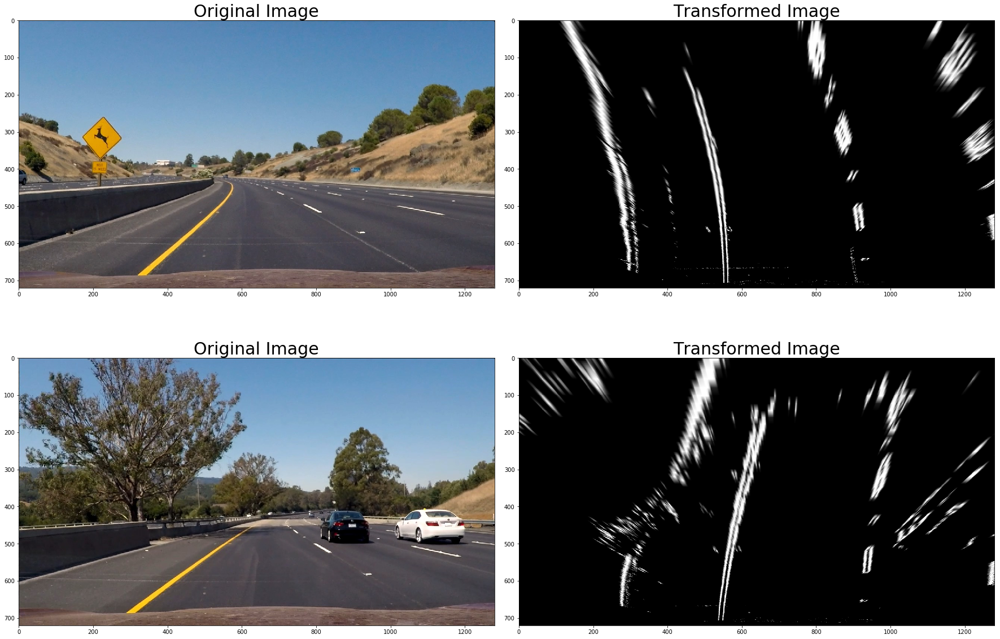

In [1238]:
compare_images(
    2, 
    sample_images, 
    compose_functions([gradient_thresholding_pipeline,perspective_pipeline]), 
    cmap_out='gray'  
)

#### 4. Combining the full pipeline

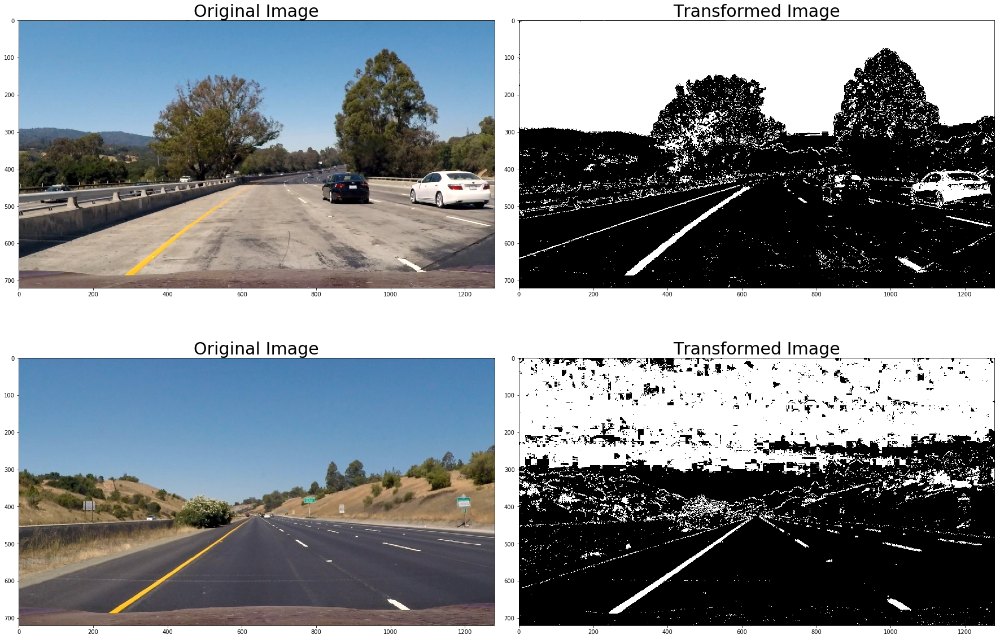

In [1234]:
color_and_gradient_pipeline = compose_functions([
    lambda p_img: (color_thresholding_pipeline(p_img), gradient_thresholding_pipeline(p_img)),
    lambda c_g: np.logical_or(c_g[0],c_g[1]).astype(np.float32)
])
compare_images(2, sample_images, color_and_gradient_pipeline, cmap_out='gray', save_to='color_gradient.png')

In [1235]:
full_preprocessing_pipeline = compose_functions([
    color_and_gradient_pipeline,
    perspective_pipeline,
])

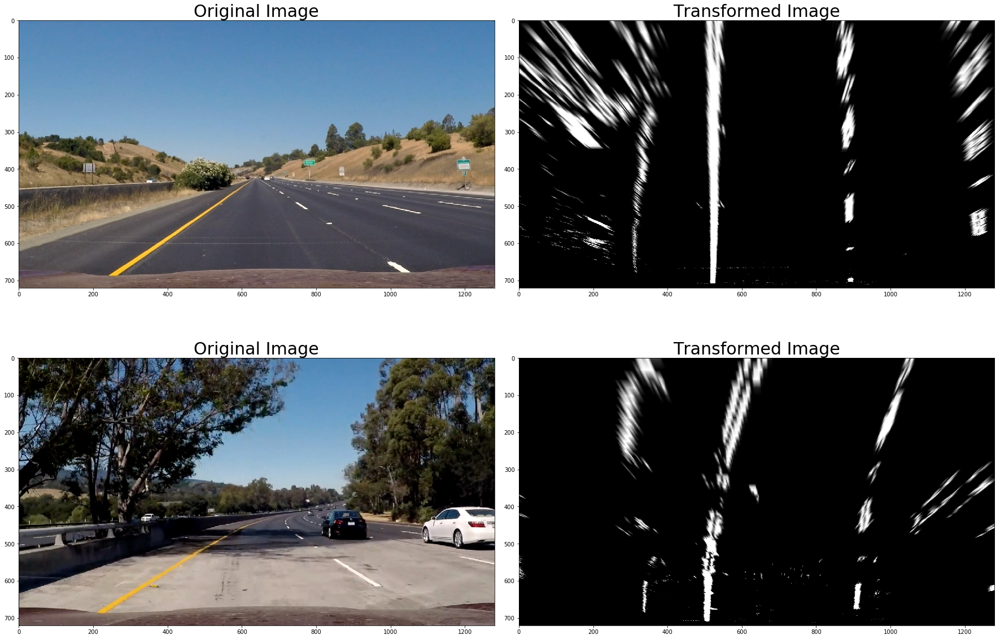

In [1239]:
compare_images(2, sample_images, full_preprocessing_pipeline, cmap_out='gray', save_to='full_pipeline.png')

### Step 3: Finding the lanes
We now use a sliding window polynomial fit technique for finding the lanes

Here we first compute the histogram of values for which we observe **1**'s (across the y axis) and we try to find 2 peaks. 

In [905]:
def get_polyfit(binary_warped, xm_per_pix=1, ym_per_pix=1):
    # Assuming we have created a warped binary image called "binary_warped" (output of full_preprocessing_pipeline)
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty * ym_per_pix, leftx * xm_per_pix, 2)
    right_fit = np.polyfit(righty * ym_per_pix, rightx * xm_per_pix, 2)
    
    return left_fit, right_fit
    
def fits_to_image(left_fit, right_fit, out_width, out_height):
    # Create an image to draw the lines on
    #warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    warp_zero = np.zeros((out_height, out_width)).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Polynomial drawing function
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
    poly_values = lambda fit: fit[0]*ploty**2 + fit[1]*ploty + fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([poly_values(left_fit), ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([poly_values(right_fit), ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    return cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

# Simple function that combines both steps
def sliding_window_polyfit(binary_warped, xm_per_pix=1, ym_per_pix=1):
    left_fit, right_fit = get_polyfit(binary_warped, xm_per_pix, ym_per_pix)
    return(
        fits_to_image(
            left_fit,
            right_fit,
            out_width=binary_warped.shape[1],
            out_height=binary_warped.shape[0]
        )
    )

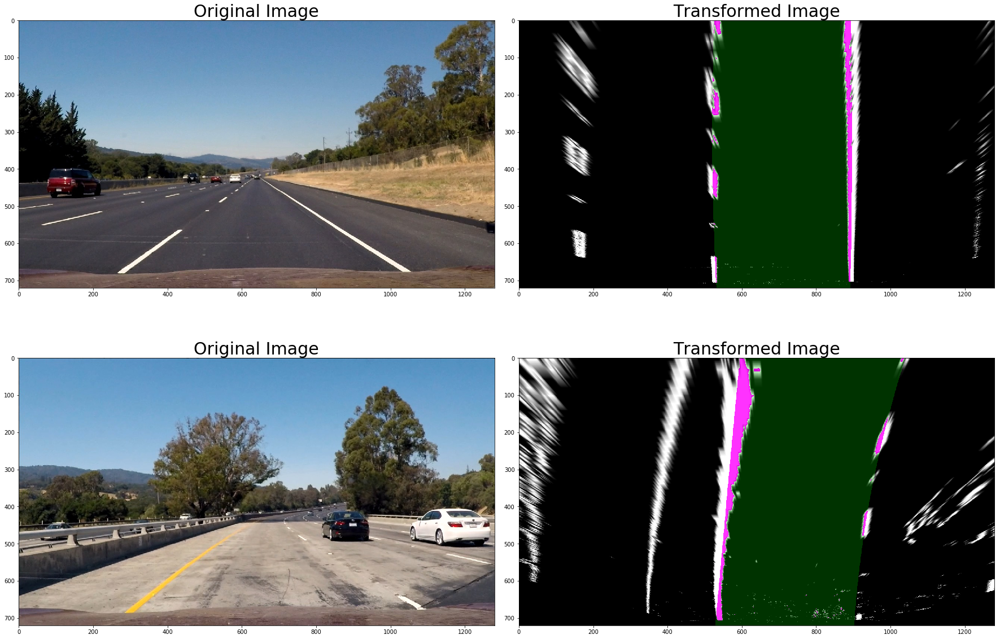

In [1241]:
polyfit_warped_overlay = compose_functions([
    full_preprocessing_pipeline,
    lambda img: (
        np.dstack((img, img, img)),                 # We keep the preprocessed image and 
        sliding_window_polyfit(img)                 #   the output so that we can overlay them
    ),                                                             
    lambda img_and_fit: cv2.addWeighted(img_and_fit[0], 1, img_and_fit[1].astype(np.float32), 0.3, 0)    
])

compare_images(
    2, 
    sample_images, 
    polyfit_warped_overlay,
    save_to='lanes_warped.png'
)

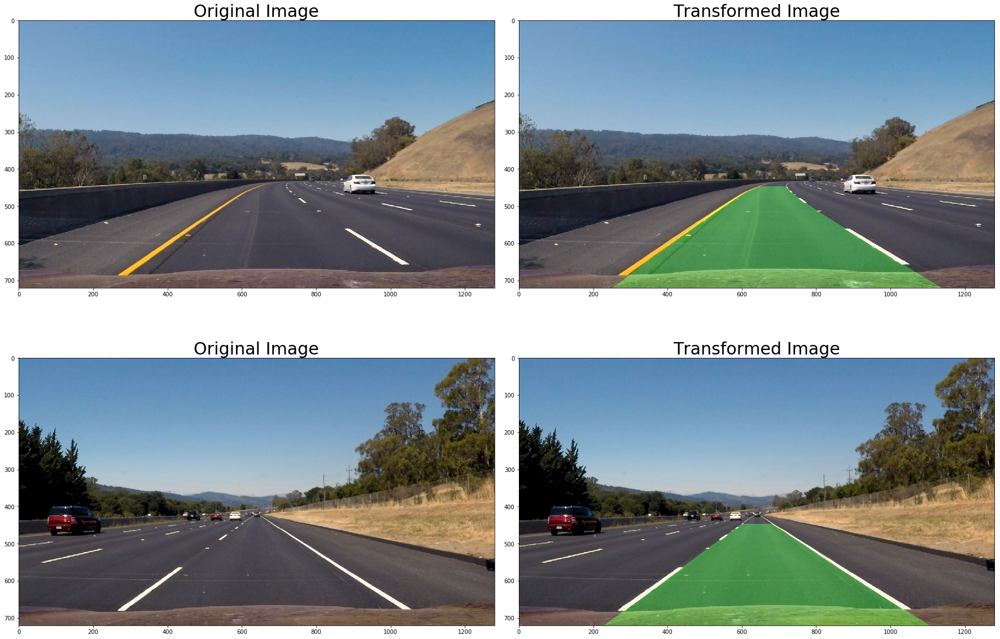

In [1242]:
polyfit_overlay = compose_functions([
    lambda img: (img, full_preprocessing_pipeline(img)),
    lambda img_tup: (img_tup[0],sliding_window_polyfit(img_tup[1])),
    lambda img_tup: (img_tup[0],cv2.warpPerspective(img_tup[1], Minv, (img_tup[1].shape[1], img_tup[1].shape[0]))),
    lambda img_and_fit: cv2.addWeighted(img_and_fit[0], 1, img_and_fit[1], 0.3, 0)    
])

compare_images(
    2, 
    sample_images, 
    polyfit_overlay,
    save_to='lanes_unwarped.png'
)

Notice that, on one of the image (*test\_images/test4.jpg*), the pipeline could not find the right lane, causing eventually a pretty bad fit.

### Step 4: Curvature of the road and sanity checks
Now, we need to have a sense of what is the curvature of the road that our pipeline outputs. This will help us check whether we have a sensible output or not. The curvature of a second degree polynomial is simply given by:
$$R_{curve}(x) = \frac{(1+(2yx_2+x_1)^2)^{\frac{3}{2}}}{|2x_2|}$$
Where __x<sub>2</sub>__ is the second-order coefficient and __x<sub>1</sub>__ is the first-order coefficient for the polynomial. __y__ is the value of the vertical axis along which we would like to measure the curvature.

In [886]:
# Let's define our curvature function, it takes as input a second-order polynomial (3-tuple) and a y-value
# p[0] is the second-order coeff, p[1] first-order coeff, p[0] is the constant coeff
def curvature(p, y):
    return ((1 + (2*p[0]*y + p[1])**2)**1.5) / np.absolute(2*p[0])

In [1325]:
# Define conversions in x and y from pixels space to meters
ym_per_pix = 21/720 # meters per pixel in y dimension
xm_per_pix = 3.7/350 # meters per pixel in x dimension

We should also define some **sanity checks** on our quadratic fits.

In [1329]:
max_width = 450

def fits_are_valid(left_fit, right_fit):
    # 1. Distance between the two lanes must be not more than 450 pixels (approx 4.7m)
    check_width = abs(left_fit[2] - right_fit[2]) < max_width
    
    # 2. Curvature for both lanes should be similar (we actually check the second-order coeff here)
    check_curvature = abs(left_fit[0] - right_fit[0]) < 0.001
    
    # 3. Lanes should be parallel 
    check_parallel = abs(left_fit[1] - right_fit[1]) < 1
    
    return (check_width and check_curvature and check_parallel)

2336.69434247 m 190.969540902 m
Fits are  valid


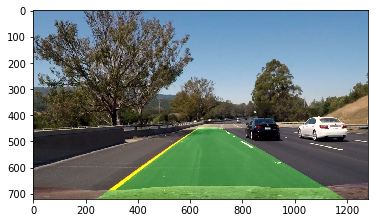

In [1346]:
random_image = random.choice(sample_images)
#random_image = 'test_images/test4.jpg' # test4.jpg is more challenging for our pipeline
plt.imshow(polyfit_overlay(plt.imread(random_image)))

left_fit, right_fit = pipe(plt.imread(random_image), full_preprocessing_pipeline, 
            lambda x: get_polyfit(x, xm_per_pix=xm_per_pix, ym_per_pix=ym_per_pix))



left_crv = curvature(left_fit, 720 * ym_per_pix)
right_crv = curvature(right_fit, 720 * ym_per_pix)

print( left_crv, 'm', right_crv, 'm', )
      
left_fit_px, right_fit_px = pipe(plt.imread(random_image), full_preprocessing_pipeline, get_polyfit)
print('Fits are {} valid'.format('' if fits_are_valid(left_fit_px, right_fit_px) else 'NOT'))

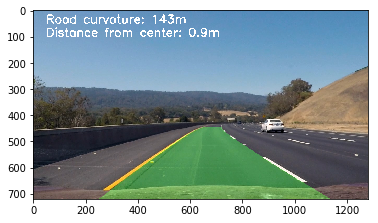

In [1336]:
def add_curvature_and_dist_from_center(img, left_fit, right_fit):
    curv = sum(list(map(lambda x: curvature(x, 720*ym_per_pix), [left_fit, right_fit])))/2
    bottom_point = lambda f: f[2] + f[1]*720*ym_per_pix + f[0]*(720*720*ym_per_pix*ym_per_pix)
    dist = (((bottom_point(left_fit) + bottom_point(right_fit)) / 2) - (1280*xm_per_pix/2))# * xm_per_pix
    
    cv2.putText(img, 'Road curvature: {0:.0f}m'.format(curv), (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), 3)
    cv2.putText(img, 'Distance from center: {0:.1f}m'.format(dist), (50, 100), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), 3)    
    
img_transformed = polyfit_overlay(plt.imread(random_image))
add_curvature_and_dist_from_center(img_transformed, left_fit, right_fit)
plt.imshow(img_transformed);

### Step 5: Video processing
We finally look into applying our pipeline to a more realistic situation where we have a continuous flow of images, i.e. _a video_.

Let's try to run the video on our basic pipeline first.

In [889]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

clip = VideoFileClip('project_video.mp4')
clip_with_lanes = clip.fl_image(polyfit_overlay) #NOTE: this function expects color images!!
%time clip_with_lanes.write_videofile('project_video_basic_output.mp4', audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [27:35<00:01,  1.52s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 33min 8s, sys: 3.68 s, total: 33min 12s
Wall time: 27min 36s


In [1186]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format('project_video_basic_output.mp4'))

Let's improve the lane detection by using several frames, as well as sanity checks!

For this we will need a simple _class_ that will store our state:

In [1337]:
from collections import deque
import operator

class RoadDetector:
    def __init__(self, smoothing):        
        self.valid_fits = deque(maxlen=smoothing) # Smoothing is the number of valid fits we want to keep
        self.valid_fits_m = deque(maxlen=smoothing)
    
    # This function adds the fits if they are valid
    def process_img(self, img):
        processed_img = full_preprocessing_pipeline(img)
        left_fit, right_fit = get_polyfit(processed_img)
        if fits_are_valid(left_fit, right_fit):            
            left_fit_m, right_fit_m = get_polyfit(processed_img, xm_per_pix=xm_per_pix, ym_per_pix=ym_per_pix)
            self.valid_fits_m.append((left_fit_m, right_fit_m))
            self.valid_fits.append((left_fit, right_fit))
            
    def get_current_fits(self,fit_type='px'):
        num_fits = len(self.valid_fits)
        if num_fits < 1:
            return (None, None)
        
        valid_fits = self.valid_fits if fit_type == 'px' else self.valid_fits_m 
        sum_tup = lambda p, c: tuple(map(sum, zip(p,c)))
        left_fit = [x / num_fits for x in reduce(sum_tup, list(map(lambda x: x[0], valid_fits)))]
        right_fit = [x / num_fits for x in reduce(sum_tup, list(map(lambda x: x[1], valid_fits)))]
        
        return left_fit, right_fit
    
    def img_pipeline(self, img):
        self.process_img(img)
        left_fit, right_fit = self.get_current_fits()
        
        # Quick check: if we have currently no good fit, we return an empty image
        if (left_fit, right_fit) == (None, None):
            zeros = np.zeros((720,1280)).astype(np.uint8) 
            return np.dstack((zeros, zeros, zeros))         
        
        return fits_to_image(left_fit, right_fit, 1280, 720)
    
    def add_data(self,img):
        left_fit, right_fit = self.get_current_fits(fit_type='m')
        if (left_fit, right_fit) != (None, None):
            add_curvature_and_dist_from_center(img, left_fit, right_fit)
        return img

We now instantiate our **RoadDetector** and define the new pipeline.

In [1338]:
road_detector = RoadDetector(5)

road_detector_pipeline = compose_functions([
    lambda img: (img,road_detector.img_pipeline(img)),
    lambda img_tup: (img_tup[0],cv2.warpPerspective(img_tup[1], Minv, (img_tup[1].shape[1], img_tup[1].shape[0]))),
    lambda img_and_fit: cv2.addWeighted(img_and_fit[0], 1, img_and_fit[1], 0.3, 0), 
    lambda img: road_detector.add_data(img)
])

Then we can quickly check that this is working well:

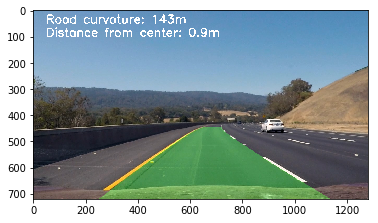

In [1339]:
random_image = random.choice(sample_images)
plt.imshow(road_detector_pipeline(plt.imread(random_image)));

Let's try our new pipeline on the video!

In [1347]:
road_detector = RoadDetector(5) # we re-instantiate the road detector in order to reset the state.

clip_with_lanes = clip.subclip(t_start=0).fl_image(road_detector_pipeline) #NOTE: this function expects color images!!
%time clip_with_lanes.write_videofile('project_video_output.mp4', audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [28:32<00:01,  1.53s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 33min 53s, sys: 3.86 s, total: 33min 57s
Wall time: 28min 33s


In [1348]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format('project_video_output.mp4'))